<a href="https://colab.research.google.com/github/elhamod/BA820/blob/main/Hands-on/regensburg_pediatric_appendicitis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Pediatrics Appendicitis Dataset

The [Regensburg Pediatric Appendicitis](https://archive.ics.uci.edu/dataset/938/regensburg+pediatric+appendicitis) holds the data from a cohort of pediatric patients with suspected appendicitis admitted with abdominal pain to Children’s Hospital St. Hedwig in Regensburg, Germany, between 2016 and 2021.

This notebook is a general analysis in attempt to understand the patterns in the dataset.

###Load the data

In [168]:
!pip install ucimlrepo

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



The following code loads the data (Modified from the code provided on the dataset's webpage)

In [169]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
regensburg_pediatric_appendicitis = fetch_ucirepo(id=938)

# data (as pandas dataframes)
df_attributes = regensburg_pediatric_appendicitis.data.features
df_targets = regensburg_pediatric_appendicitis.data.targets

# variable information
regensburg_pediatric_appendicitis.variables


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,name,role,type,demographic,description,units,missing_values
0,Age,Feature,Continuous,Age,Obtained from the date of birth,years,yes
1,BMI,Feature,Continuous,None,Measures body fat; patient's weight divided by...,None,yes
2,Sex,Feature,Categorical,Sex,Registered gender,None,yes
3,Height,Feature,Continuous,None,Patient's height,None,yes
4,Weight,Feature,Integer,None,Patient's weight,None,yes
5,Length_of_Stay,Feature,Integer,None,Length of the stay in the hospital,None,yes
6,Management,Target,Categorical,None,"(conservative, primary surgical, secondary sur...",None,yes
7,Severity,Target,Categorical,None,"(uncomplicated, complicated) Severity of appen...",None,yes
8,Diagnosis_Presumptive,Other,Binary,None,Patient's suspected diagnosis,None,yes
9,Diagnosis,Target,Binary,None,"Patient's diagnosis, histologically confirmed ...",None,yes


It seems there are some attributes that are numerical (integer or continuous), and some that are categorical (binary or otherwise)

Let's split the attributes into numerical vs. categorical

In [170]:
vars = regensburg_pediatric_appendicitis.variables

cat_vars = vars[vars['type'] == 'Categorical']['name'].tolist()
int_vars = vars[vars['type'] == 'Integer']['name'].tolist()
cont_vars = vars[vars['type'] == 'Continuous']['name'].tolist()
bin_vars = vars[vars['type'] == 'Binary']['name'].tolist()

categorical_vars = (cat_vars + bin_vars)
continuous_vars = (cont_vars + int_vars)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



###Let's analyze the categorical attributes

For each attribute:
1. What are the unique values.
2. How many nans are there?
3. If we are to replace the nans? what can we use? Maybe the mode value for each.

Let's print the unique values per attribute

In [171]:
df_categorical = df_attributes[df_attributes.columns & categorical_vars]

unique = df_categorical.apply(lambda col: col.unique())
pd.DataFrame(unique)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-171-889f35f5a26a>:1: FutureWarning:

Index.__and__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__and__.  Use index.intersection(other) instead.



,0
Sex,"[female, male, nan]"
Appendix_on_US,"[yes, no, nan]"
Migratory_Pain,"[no, yes, nan]"
Lower_Right_Abd_Pain,"[yes, no, nan]"
Contralateral_Rebound_Tenderness,"[yes, no, nan]"
Coughing_Pain,"[no, yes, nan]"
Nausea,"[no, yes, nan]"
Loss_of_Appetite,"[yes, no, nan]"
Neutrophilia,"[no, yes, nan]"
Ketones_in_Urine,"[++, no, nan, +++, +]"


How bad are the nans?


In [172]:
nan_percents = df_categorical.isna().sum()/df_categorical.shape[0]

pd.DataFrame(nan_percents, columns=['percents_of_nans']).sort_values('percents_of_nans')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,percents_of_nans
Sex,0.002558
US_Performed,0.005115
Appendix_on_US,0.006394
Lower_Right_Abd_Pain,0.010230
Nausea,0.010230
Migratory_Pain,0.011509
Peritonitis,0.011509
Loss_of_Appetite,0.012788
Contralateral_Rebound_Tenderness,0.019182
Coughing_Pain,0.020460


Seems most attributes have nans.

**Questions:**: *What are the ways to deal with these nans?*

For now, let's replace the missing values with the most common value of that column.

In [173]:
modes = df_categorical.mode().iloc[0]

pd.DataFrame(modes)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,0
Sex,male
Appendix_on_US,yes
Migratory_Pain,no
Lower_Right_Abd_Pain,yes
Contralateral_Rebound_Tenderness,no
Coughing_Pain,no
Nausea,yes
Loss_of_Appetite,yes
Neutrophilia,no
Ketones_in_Urine,no


In [174]:
df_categorical_corrected = df_categorical.copy()

for column in df_categorical.columns:
    # Calculate the mode for the column
    mode_value = df_categorical[column].mode(dropna=True)[0]
    # Use loc to ensure you're modifying the original DataFrame
    df_categorical_corrected[column] = df_categorical[column].fillna(mode_value)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [175]:
df_categorical_corrected.isna().sum()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Sex                                 0
Appendix_on_US                      0
Migratory_Pain                      0
Lower_Right_Abd_Pain                0
Contralateral_Rebound_Tenderness    0
Coughing_Pain                       0
Nausea                              0
Loss_of_Appetite                    0
Neutrophilia                        0
Ketones_in_Urine                    0
RBC_in_Urine                        0
WBC_in_Urine                        0
Dysuria                             0
Stool                               0
Peritonitis                         0
Psoas_Sign                          0
Ipsilateral_Rebound_Tenderness      0
US_Performed                        0
Free_Fluids                         0
Appendix_Wall_Layers                0
Target_Sign                         0
Appendicolith                       0
Perfusion                           0
Perforation                         0
Surrounding_Tissue_Reaction         0
Appendicular_Abscess                0
Abscess_Loca

In [176]:
unique = df_categorical_corrected.apply(lambda col: col.unique())
pd.DataFrame(unique)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,0
Sex,"[female, male]"
Appendix_on_US,"[yes, no]"
Migratory_Pain,"[no, yes]"
Lower_Right_Abd_Pain,"[yes, no]"
Contralateral_Rebound_Tenderness,"[yes, no]"
Coughing_Pain,"[no, yes]"
Nausea,"[no, yes]"
Loss_of_Appetite,"[yes, no]"
Neutrophilia,"[no, yes]"
Ketones_in_Urine,"[++, no, +++, +]"


If we are going to use these columns, we will probably need to replace them with codes.

In [177]:
df_categorical_corrected = df_categorical_corrected.astype('category')
df_categorical_corrected['Sex'].cat.categories

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Index(['female', 'male'], dtype='object')

In [178]:
for c in df_categorical_corrected.columns:
  df_categorical_corrected[c] = df_categorical_corrected[c].cat.codes
df_categorical_corrected

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Sex,Appendix_on_US,Migratory_Pain,Lower_Right_Abd_Pain,Contralateral_Rebound_Tenderness,Coughing_Pain,Nausea,Loss_of_Appetite,Neutrophilia,Ketones_in_Urine,...,Abscess_Location,Pathological_Lymph_Nodes,Lymph_Nodes_Location,Bowel_Wall_Thickening,Conglomerate_of_Bowel_Loops,Ileus,Coprostasis,Meteorism,Enteritis,Gynecological_Findings
0,0,1,0,1,1,0,0,1,0,1,...,0,1,23,1,0,0,1,1,1,11
1,1,0,1,1,1,0,0,1,0,3,...,0,1,11,1,0,0,1,1,1,11
2,0,0,0,1,1,0,0,0,0,3,...,0,1,11,1,0,0,1,1,1,11
3,0,0,1,1,0,0,1,1,0,3,...,0,1,23,1,0,0,1,1,1,11
4,0,1,0,1,1,1,1,1,0,3,...,0,1,23,1,0,0,1,1,1,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777,0,1,1,1,0,0,0,1,1,3,...,0,1,11,1,0,0,1,1,1,11
778,0,0,0,0,0,0,0,1,1,3,...,0,1,11,1,1,0,1,1,1,11
779,0,0,0,1,0,0,0,0,0,3,...,0,1,11,1,0,0,1,1,1,13
780,1,1,1,1,0,1,1,0,1,2,...,0,0,11,1,0,0,1,1,1,11


###Let's analyze the numerical attributes

Just like we did with categorical attributes, let's replace nans with mean values.

In [179]:
df_numeric = df_attributes[df_attributes.columns & continuous_vars]
df_numeric_means = df_numeric.mean()
df_numeric_filled = df_numeric.fillna(df_numeric_means)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-179-093bcce79958>:1: FutureWarning:

Index.__and__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__and__.  Use index.intersection(other) instead.



Let's normalize the numerical data

In [180]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

scaler = StandardScaler()

df_numeric_corrected = pd.DataFrame(scaler.fit_transform(df_numeric_filled), columns = df_numeric_filled.columns)
df_numeric_corrected

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Age,BMI,Height,Weight,Length_of_Stay,Alvarado_Score,Paedriatic_Appendicitis_Score,Appendix_Diameter,Body_Temperature,WBC_Count,Neutrophil_Percentage,Segmented_Neutrophils,RBC_Count,Hemoglobin,RDW,Thrombocyte_Count,CRP
0,0.378270,-0.466085,-0.000901,-0.355839,-0.500450,-0.923275,-1.191705,-3.276768e-01,-0.449941,-0.930412,-0.266652,0.0,0.954551,1.031434,-0.219809,-0.436439,-0.550730
1,0.781062,3.017340,-0.052478,1.517743,-0.890190,-0.442883,-0.662863,4.391989e-16,-0.561170,-0.855540,-0.519111,0.0,0.934264,1.685389,-0.107695,-1.874820,-0.498090
2,0.792408,1.020176,0.772759,1.085378,-0.110710,-0.442883,-1.191705,4.391989e-16,-0.894858,0.099078,0.223413,0.0,-1.662545,-1.439063,-0.219809,0.205945,-0.498090
3,1.424962,0.393160,0.875913,0.739486,-0.500450,0.517903,0.394820,4.391989e-16,-1.562234,-0.237846,-0.652765,0.0,-0.323565,0.159494,0.004419,-0.380579,-0.550730
4,-0.075581,-0.466085,0.772759,0.105351,-0.500450,-0.442883,0.394820,-3.771262e-01,-0.561170,-0.855540,-2.063560,0.0,-0.729317,-0.567122,0.094111,0.359559,-0.550730
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777,0.301682,1.473022,0.953279,1.546568,-0.110710,0.998296,0.923662,-1.298792e-01,2.219563,-0.237846,0.357068,0.0,0.305349,0.232156,0.049265,-0.590052,0.695071
778,1.629194,0.353681,0.514872,0.451243,0.668769,-0.442883,-1.191705,4.391989e-16,0.439894,0.885233,1.292648,0.0,-0.567016,-0.203814,-0.085272,0.345594,3.748158
779,1.033516,0.232922,0.205409,0.162999,-0.110710,-0.442883,-1.191705,4.391989e-16,-0.116253,0.361130,-0.244377,0.0,-0.627879,-0.494461,-0.085272,0.596962,-0.515637
780,-1.176167,-1.069879,-0.965396,-1.111037,0.279030,1.478688,1.452504,3.084332e+00,0.106206,0.960105,0.386769,0.0,0.345924,0.668126,-0.107695,0.834364,-0.410358


###Let's do the same for targets data

In [181]:
df_targets.columns

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Index(['Management', 'Severity', 'Diagnosis'], dtype='object')

We could fill nan values like we did with categorical variables. But, since these are generally used for prediction, we might want to be more conservative here. So, let's just drop them if appropriate

In [182]:
nan_percents = df_targets.isna().sum()/df_targets.shape[0]

pd.DataFrame(nan_percents, columns=['percents_of_nans']).sort_values('percents_of_nans')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,percents_of_nans
Management,0.001279
Severity,0.001279
Diagnosis,0.002558


Remember, we need to drop corresponding rows from all dataframes

In [183]:
df_targets_corrected = df_targets.copy()

na_indices = df_targets[df_targets.isna().any(axis=1)].index
df_targets_corrected.drop(na_indices, axis=0)
df_numeric_corrected.drop(na_indices, axis=0)
df_categorical_corrected.drop(na_indices, axis=0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Sex,Appendix_on_US,Migratory_Pain,Lower_Right_Abd_Pain,Contralateral_Rebound_Tenderness,Coughing_Pain,Nausea,Loss_of_Appetite,Neutrophilia,Ketones_in_Urine,...,Abscess_Location,Pathological_Lymph_Nodes,Lymph_Nodes_Location,Bowel_Wall_Thickening,Conglomerate_of_Bowel_Loops,Ileus,Coprostasis,Meteorism,Enteritis,Gynecological_Findings
0,0,1,0,1,1,0,0,1,0,1,...,0,1,23,1,0,0,1,1,1,11
1,1,0,1,1,1,0,0,1,0,3,...,0,1,11,1,0,0,1,1,1,11
2,0,0,0,1,1,0,0,0,0,3,...,0,1,11,1,0,0,1,1,1,11
3,0,0,1,1,0,0,1,1,0,3,...,0,1,23,1,0,0,1,1,1,11
4,0,1,0,1,1,1,1,1,0,3,...,0,1,23,1,0,0,1,1,1,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777,0,1,1,1,0,0,0,1,1,3,...,0,1,11,1,0,0,1,1,1,11
778,0,0,0,0,0,0,0,1,1,3,...,0,1,11,1,1,0,1,1,1,11
779,0,0,0,1,0,0,0,0,0,3,...,0,1,11,1,0,0,1,1,1,13
780,1,1,1,1,0,1,1,0,1,2,...,0,0,11,1,0,0,1,1,1,11


Convert to categories

In [184]:
df_targets_corrected = df_targets_corrected.astype('category')
for c in df_targets_corrected.columns:
  df_targets_corrected[c] = df_targets_corrected[c].cat.codes
df_targets_corrected

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Management,Severity,Diagnosis
0,0,1,0
1,0,1,1
2,0,1,1
3,0,1,1
4,0,1,0
...,...,...,...
777,1,1,0
778,2,0,0
779,1,1,0
780,1,1,0


###Combine all dataframes!

In [185]:
import pandas as pd
df_data_corrected = pd.concat([df_numeric_corrected, df_categorical_corrected, df_targets_corrected], axis=1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [186]:
df_data_corrected

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Age,BMI,Height,Weight,Length_of_Stay,Alvarado_Score,Paedriatic_Appendicitis_Score,Appendix_Diameter,Body_Temperature,WBC_Count,...,Bowel_Wall_Thickening,Conglomerate_of_Bowel_Loops,Ileus,Coprostasis,Meteorism,Enteritis,Gynecological_Findings,Management,Severity,Diagnosis
0,0.378270,-0.466085,-0.000901,-0.355839,-0.500450,-0.923275,-1.191705,-3.276768e-01,-0.449941,-0.930412,...,1,0,0,1,1,1,11,0,1,0
1,0.781062,3.017340,-0.052478,1.517743,-0.890190,-0.442883,-0.662863,4.391989e-16,-0.561170,-0.855540,...,1,0,0,1,1,1,11,0,1,1
2,0.792408,1.020176,0.772759,1.085378,-0.110710,-0.442883,-1.191705,4.391989e-16,-0.894858,0.099078,...,1,0,0,1,1,1,11,0,1,1
3,1.424962,0.393160,0.875913,0.739486,-0.500450,0.517903,0.394820,4.391989e-16,-1.562234,-0.237846,...,1,0,0,1,1,1,11,0,1,1
4,-0.075581,-0.466085,0.772759,0.105351,-0.500450,-0.442883,0.394820,-3.771262e-01,-0.561170,-0.855540,...,1,0,0,1,1,1,11,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777,0.301682,1.473022,0.953279,1.546568,-0.110710,0.998296,0.923662,-1.298792e-01,2.219563,-0.237846,...,1,0,0,1,1,1,11,1,1,0
778,1.629194,0.353681,0.514872,0.451243,0.668769,-0.442883,-1.191705,4.391989e-16,0.439894,0.885233,...,1,1,0,1,1,1,11,2,0,0
779,1.033516,0.232922,0.205409,0.162999,-0.110710,-0.442883,-1.191705,4.391989e-16,-0.116253,0.361130,...,1,0,0,1,1,1,13,1,1,0
780,-1.176167,-1.069879,-0.965396,-1.111037,0.279030,1.478688,1.452504,3.084332e+00,0.106206,0.960105,...,1,0,0,1,1,1,11,1,1,0


##Investigating with the numerical attributes

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



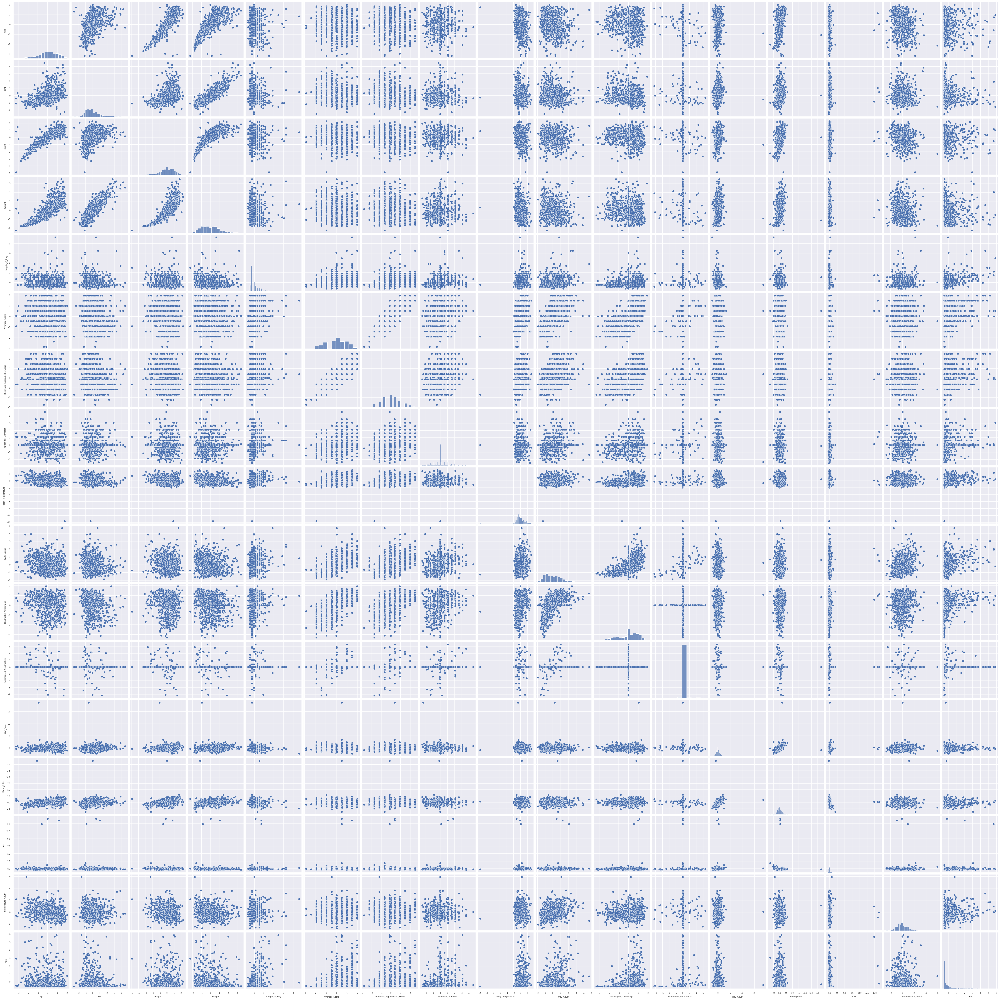

In [187]:
sns.pairplot(df_numeric_corrected)

**Question**: *I see many outliers. Should anything be done about these? Should there be anything done about them?*

Seems there is some decent correlation between Age, BMI, weight, and height. (makes sense).

Let's plot Age, BMI, and Alvarado_Score

In [188]:
import numpy as np
import plotly.express as px

columns_of_interest = ['Age', 'Alvarado_Score', 'WBC_Count']
target_of_interest = 'Diagnosis'

df_numeric_corrected_3D = pd.DataFrame(df_numeric_corrected[columns_of_interest], columns=columns_of_interest)

df_numeric_corrected_3D_with_targets = pd.concat([df_numeric_corrected_3D, df_targets], axis=1)

fig = px.scatter_3d(df_numeric_corrected_3D_with_targets, x=columns_of_interest[0], y=columns_of_interest[1], z=columns_of_interest[2], color=target_of_interest)
fig.update_traces(marker_size = 3)
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Well it looks like this is hard to wrap our heads around... Let's do some dimenationality reduction.



###PCA

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



<Axes: >

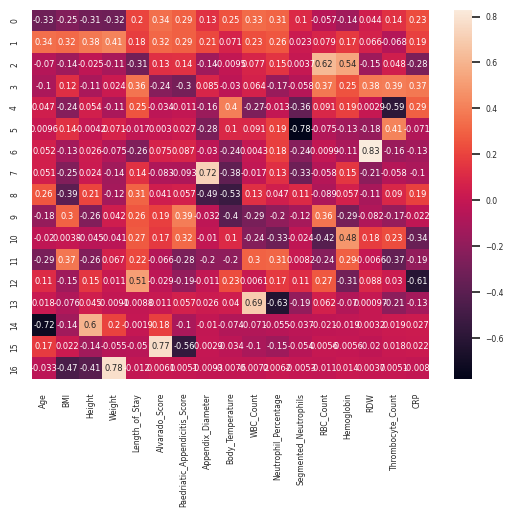

In [189]:
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(df_numeric_corrected)
pca.components_.shape

df_components = pd.DataFrame(pca.components_, columns = df_numeric_corrected.columns)

import seaborn as sns
sns.set(font_scale=0.5)
sns.heatmap(df_components, annot=True, )

*How would you interprest the first two rows?*

Let's show the scree plot

In [190]:
fig = px.line(pd.DataFrame(np.cumsum(pca.explained_variance_ratio_)))
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Let's plot the top 3 PCs.

In [191]:
df_numeric_corrected_transformed_3D = pd.DataFrame(pca.transform(df_numeric_corrected)[:, 0:3], columns=['PC1', 'PC2', 'PC3'])

fig = px.scatter_3d(df_numeric_corrected_transformed_3D, x='PC1', y='PC2', z='PC3',)
fig.update_traces(marker_size = 3)
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Let's plot with some targets

In [192]:
df_numeric_corrected_transformed_3D_with_targets = pd.concat([df_numeric_corrected_transformed_3D, df_targets], axis=1)

fig = px.scatter_3d(df_numeric_corrected_transformed_3D_with_targets, x='PC1', y='PC2', z='PC3', color='Diagnosis')
fig.update_traces(marker_size = 3)
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



###Unsupervised Learning for Supervised Learning (PCA for Classification)

Let's use logisitic regression to see if PCA helps with logisitic regression.

**Question**: *Do you anticipate it will help or not? Does it depend on something? What would you do to find the answer?*

First, let's establish the accuracy using original attributes...

In [209]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

df_inputs = pd.concat([df_numeric_corrected, df_categorical_corrected], axis=1)
df_outputs = df_targets_corrected['Diagnosis']

X_train, X_test, y_train, y_test  = train_test_split(df_inputs, df_outputs, test_size=0.2, random_state=0)

clf = LogisticRegression(random_state=0).fit(X_train, y_train)
clf.score(X_test, y_test)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



0.8726114649681529

Let's compare that with the top 3PCs (+ categorical attributes)

In [210]:
df_inputs = pd.concat([df_numeric_corrected_transformed_3D, df_categorical_corrected], axis=1)


X_train, X_test, y_train, y_test  = train_test_split(df_inputs, df_outputs, test_size=0.2, random_state=0)

clf = LogisticRegression(random_state=0).fit(X_train, y_train)
clf.score(X_test, y_test)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



0.8535031847133758

###Clustering

Let's try some clustering

In [193]:
n_clusters = 3

df_numeric_corrected_with_clustering = df_numeric_corrected.copy()


columns_of_interest = ['Age', 'Alvarado_Score', 'WBC_Count']
target_of_interest = 'cluster_labels'

#hierarchical clusterung
# from scipy.cluster.hierarchy import linkage, fcluster
# Z = linkage(df_numeric_corrected, 'ward')
# df_numeric_corrected_with_clustering['cluster_labels'] = fcluster(Z, n_clusters, criterion='maxclust')

#Kmeans clustering
from sklearn.cluster import KMeans
df_numeric_corrected_with_clustering['cluster_labels'] = KMeans(n_clusters=n_clusters, n_init="auto").fit_predict(df_numeric_corrected)

fig = px.scatter_3d(df_numeric_corrected_with_clustering, x=columns_of_interest[0], y=columns_of_interest[1], z=columns_of_interest[2], color=target_of_interest)
fig.update_traces(marker_size = 3)
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



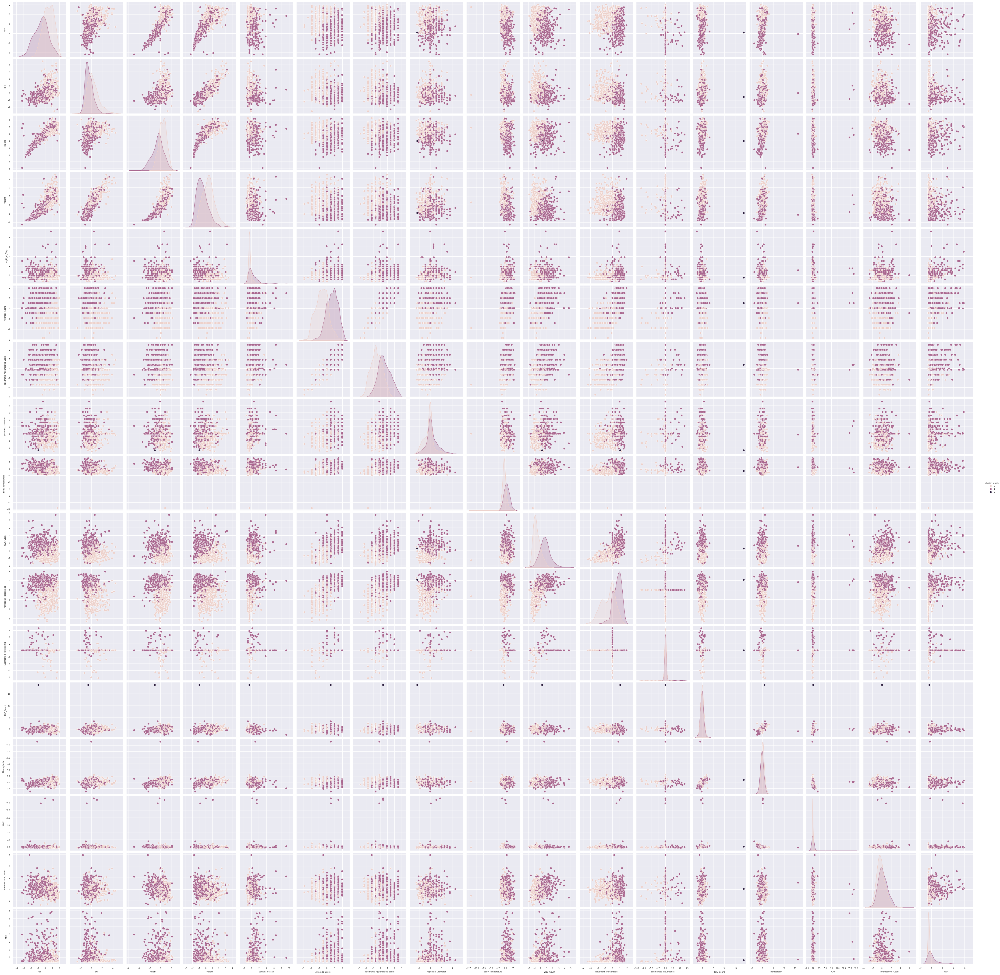

In [194]:
sns.pairplot(df_numeric_corrected_with_clustering, hue='cluster_labels')

Seems the clustering aligns well with the (Age/BMI/weight/height) direction and (WBC_Count/Neutrophil_percentage).

Seems this aligns well with PCA.

We can use `crosstab` to see the relationship between the clustering and different targets

In [195]:
pd.crosstab(df_numeric_corrected_with_clustering['cluster_labels'], df_targets['Severity'])
# pd.crosstab(df_numeric_corrected[df_targets['Severity'] == 'complicated']['cluster_labels'], df_targets['Diagnosis'])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Severity,complicated,uncomplicated
cluster_labels,,
0,11,404
1,108,257
2,0,1


We have been working with numerical variables. Let's check how the clustering maps to the categorical variables.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-196-c1728dc2990f>:3: FutureWarning:

Index.__and__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__and__.  Use index.intersection(other) instead.



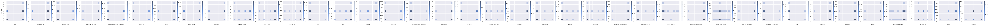

In [196]:
df_data_with_clustering = pd.concat([df_data_corrected, df_numeric_corrected_with_clustering['cluster_labels']], axis=1)

g = sns.PairGrid(data=df_data_with_clustering, y_vars=['cluster_labels'], x_vars=df_data_corrected.columns & categorical_vars)

g.map(sns.histplot, cbar=True)
# g.map(sns.kdeplot)
g.add_legend()

###tSNE

tSNE can draw a nice 3D plot where datapoints that are similar are clustered

In [197]:
from sklearn.manifold import TSNE

tsne_embedding = TSNE(n_components=3).fit_transform(df_numeric_corrected)
df_embeddings_with_categorical_and_targets = pd.concat([pd.DataFrame(tsne_embedding, columns=['tSNE1', 'tSNE2', 'tSNE3']), df_categorical , df_targets], axis=1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [198]:
df_embeddings_with_categorical_and_targets

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,tSNE1,tSNE2,tSNE3,Sex,Appendix_on_US,Migratory_Pain,Lower_Right_Abd_Pain,Contralateral_Rebound_Tenderness,Coughing_Pain,Nausea,...,Bowel_Wall_Thickening,Conglomerate_of_Bowel_Loops,Ileus,Coprostasis,Meteorism,Enteritis,Gynecological_Findings,Management,Severity,Diagnosis
0,-8.028053,1.867991,-4.952716,female,yes,no,yes,yes,no,no,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,conservative,uncomplicated,appendicitis
1,-9.258670,-8.867178,1.153707,male,no,yes,yes,yes,no,no,...,NaN,NaN,NaN,NaN,yes,NaN,NaN,conservative,uncomplicated,no appendicitis
2,-5.938840,-5.157591,4.719113,female,no,no,yes,yes,no,no,...,NaN,NaN,NaN,NaN,yes,yes,NaN,conservative,uncomplicated,no appendicitis
3,-2.330575,-6.566460,0.671986,female,no,yes,yes,no,no,yes,...,NaN,NaN,NaN,NaN,NaN,yes,NaN,conservative,uncomplicated,no appendicitis
4,-9.848030,2.477497,3.216005,female,yes,no,yes,yes,yes,yes,...,NaN,NaN,NaN,NaN,NaN,yes,NaN,conservative,uncomplicated,appendicitis
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777,4.149008,-5.622109,5.583131,female,yes,yes,yes,no,no,no,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,primary surgical,uncomplicated,appendicitis
778,11.463954,-6.421256,8.160829,female,no,no,no,no,no,no,...,yes,yes,NaN,NaN,NaN,NaN,NaN,secondary surgical,complicated,appendicitis
779,-4.294506,-0.784670,2.948025,female,no,no,yes,no,no,no,...,NaN,NaN,NaN,NaN,NaN,NaN,unauffällig,primary surgical,uncomplicated,appendicitis
780,9.128781,0.285817,-7.176418,male,yes,yes,yes,no,yes,yes,...,yes,NaN,no,NaN,NaN,NaN,NaN,primary surgical,uncomplicated,appendicitis


In [199]:
color_column = 'Severity'
hover_columns = df_categorical.columns | df_targets.columns

fig = px.scatter_3d(df_embeddings_with_categorical_and_targets, x='tSNE1', y='tSNE2', z='tSNE3', color=color_column, hover_data=hover_columns)
fig.update_traces(marker_size = 3)
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-199-13c1f680c7c3>:2: FutureWarning:

Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead.



Unfortunately, tSNE axes are not interpretable. However, we can use the plot to check which patients have similar attributes, how they are similiar, and if the map to any targets.

## Can we do any predictions based on categorical attributes?



We already have the attributes in an encoded format.



*Is there anything fishy here?*...



Let's use `get_dummies` to separate the different possible values into their own columns.

In [211]:
import pandas as pd

df_categorical_and_targets = pd.concat([df_categorical, df_targets], axis=1)
df_categorical_and_targets_encoded = pd.get_dummies(df_categorical_and_targets)

df_categorical_and_targets_encoded

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Sex_female,Sex_male,Appendix_on_US_no,Appendix_on_US_yes,Migratory_Pain_no,Migratory_Pain_yes,Lower_Right_Abd_Pain_no,Lower_Right_Abd_Pain_yes,Contralateral_Rebound_Tenderness_no,Contralateral_Rebound_Tenderness_yes,...,Gynecological_Findings_kleine Ovarzyste rechts,Gynecological_Findings_unauffällig,Management_conservative,Management_primary surgical,Management_secondary surgical,Management_simultaneous appendectomy,Severity_complicated,Severity_uncomplicated,Diagnosis_appendicitis,Diagnosis_no appendicitis
0,1,0,0,1,1,0,0,1,0,1,...,0,0,1,0,0,0,0,1,1,0
1,0,1,1,0,0,1,0,1,0,1,...,0,0,1,0,0,0,0,1,0,1
2,1,0,1,0,1,0,0,1,0,1,...,0,0,1,0,0,0,0,1,0,1
3,1,0,1,0,0,1,0,1,1,0,...,0,0,1,0,0,0,0,1,0,1
4,1,0,0,1,1,0,0,1,0,1,...,0,0,1,0,0,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777,1,0,0,1,0,1,0,1,1,0,...,0,0,0,1,0,0,0,1,1,0
778,1,0,1,0,1,0,1,0,1,0,...,0,0,0,0,1,0,1,0,1,0
779,1,0,1,0,1,0,0,1,1,0,...,0,1,0,1,0,0,0,1,1,0
780,0,1,0,1,0,1,0,1,1,0,...,0,0,0,1,0,0,0,1,1,0


Let's use some association rules.

In [204]:
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Let's use the `apriori` call. start with a high value of support. Notice that if you set it low, you will run out of memory!

In [212]:
frequent_itemsets = apriori(df_categorical_and_targets_encoded, max_len=3, min_support=0.1, use_colnames=True)
frequent_itemsets

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



,support,itemsets
0,0.482097,(Sex_female)
1,0.515345,(Sex_male)
2,0.349105,(Appendix_on_US_no)
3,0.644501,(Appendix_on_US_yes)
4,0.718670,(Migratory_Pain_no)
...,...,...
5485,0.109974,"(Management_conservative, Meteorism_yes, Sever..."
5486,0.217391,"(Management_conservative, Diagnosis_appendicit..."
5487,0.400256,"(Management_conservative, Severity_uncomplicat..."
5488,0.145780,"(Management_primary surgical, Diagnosis_append..."


Let's get the association rules.

In [213]:
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.9)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



I would like to know what predictors give with very high probability that the patient has appendicitis,

In [214]:
rules = rules[rules['consequents']==frozenset({'Diagnosis_appendicitis'})]
rules.sort_values(by="confidence")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
1881,"(Neutrophilia_yes, Peritonitis_local)",(Diagnosis_appendicitis),0.159847,0.592072,0.144501,0.904000,1.526842,0.049861,4.249254,0.410703
2454,"(Surrounding_Tissue_Reaction_yes, Severity_unc...",(Diagnosis_appendicitis),0.185422,0.592072,0.170077,0.917241,1.549207,0.060294,4.929135,0.435205
2257,"(Free_Fluids_yes, Peritonitis_local)",(Diagnosis_appendicitis),0.129156,0.592072,0.118926,0.920792,1.555204,0.042456,5.150096,0.409944
2020,"(Surrounding_Tissue_Reaction_yes, RBC_in_Urine...",(Diagnosis_appendicitis),0.134271,0.592072,0.124041,0.923810,1.560300,0.044543,5.354060,0.414792
1525,"(Surrounding_Tissue_Reaction_yes, Coughing_Pai...",(Diagnosis_appendicitis),0.170077,0.592072,0.157289,0.924812,1.561994,0.056591,5.425448,0.433525
...,...,...,...,...,...,...,...,...,...,...
1577,"(Management_primary surgical, Coughing_Pain_yes)",(Diagnosis_appendicitis),0.106138,0.592072,0.106138,1.000000,1.688985,0.043297,inf,0.456366
2453,"(Surrounding_Tissue_Reaction_yes, Management_p...",(Diagnosis_appendicitis),0.185422,0.592072,0.185422,1.000000,1.688985,0.075639,inf,0.500785
1326,"(Lower_Right_Abd_Pain_yes, Severity_complicated)",(Diagnosis_appendicitis),0.139386,0.592072,0.139386,1.000000,1.688985,0.056860,inf,0.473997
2207,"(Management_primary surgical, Dysuria_no)",(Diagnosis_appendicitis),0.295396,0.592072,0.295396,1.000000,1.688985,0.120501,inf,0.578947
